# LoS Detection Strategy 

To detect the level of service (LOS) of a highway from a video of traffic, you would typically follow a series of steps involving video processing, vehicle detection and tracking, and LOS classification. Here's an outline of the process:

1. Video Preprocessing
Frame Extraction: Extract frames from the video at regular intervals, say every 5 seconds.
Stabilization (if necessary): If the video is shaky or moving, apply video stabilization techniques to make it more suitable for analysis.
2. Vehicle Detection and Tracking
Object Detection: Use a deep learning model like YOLO (You Only Look Once), SSD (Single Shot Multibox Detector), or Faster R-CNN to detect vehicles in each frame.
Object Tracking: Implement a tracking algorithm such as SORT (Simple Online and Realtime Tracking) or DeepSORT to track the detected vehicles over multiple frames.
3. Traffic Flow Analysis
Vehicle Count: Count the number of vehicles passing through a defined section of the highway in each 5-second interval.
Speed Estimation: Estimate the speed of each tracked vehicle by measuring the distance covered between frames and knowing the frame rate and camera calibration.
Density Estimation: Calculate the density of vehicles on the highway segment by counting the number of vehicles per unit length of the road.
4. Level of Service (LOS) Classification
Traffic Flow Parameters: The LOS is determined based on parameters like speed, density, and flow (vehicles per hour). Use these metrics to classify the LOS.
- Free Flow (LOS A): Low vehicle density, high speed, and smooth traffic flow.
- Stable Flow (LOS B, C, D): Increasing vehicle density with minor to moderate delays.
- Unstable Flow (LOS E): High vehicle density with frequent stops and low speeds.
- Forced or Breakdown Flow (LOS F): Traffic congestion with very low speeds and frequent stops.
- Classification Model: You can use predefined thresholds for these parameters or train a machine learning model to classify the LOS based on historical data.
5. Output Generation
Time-Series Data: Generate a time series of LOS values every 5 seconds based on the analysis.
Visualization: Create visualizations or reports showing how the LOS changes over time during the video.
Tools and Libraries
OpenCV: For video processing and vehicle detection/tracking.
TensorFlow/PyTorch: For implementing deep learning models for object detection.
Scikit-learn/Pandas: For data analysis and LOS classification.
Custom Scripts: For calculating traffic flow parameters and LOS.
Example Workflow:
Extract Frames: Extract frames at 5-second intervals from the video.
Detect and Track Vehicles: Detect vehicles in each frame and track their movement across frames.
Calculate Traffic Metrics: Compute the speed, count, and density of vehicles.
Classify LOS: Use the calculated metrics to determine the LOS for each 5-second interval.
Generate Output: Produce a report or visual representation of LOS over time.
This approach provides a continuous and dynamic assessment of the highway's level of service using video data.

# 1. Install requirements

In [ ]:
!pip install -r requirements.txt

# Setup constants

In [ ]:
# Constants
mqt_broker = 'mqtt-broker.trafficcounter.svc.cluster.local'
streaming_server = 'http://cv-streamer-trafficcounter.apps.ocpbare.davenet.local/stream/gdot-cameraC01.m3u8'


# 3. Run the analysis on the stream

/tmp/ipykernel_403/1047754870.py:13: DeprecationWarning: Callback API version 1 is deprecated, update to latest version
  mqtt_client = mqtt.Client()


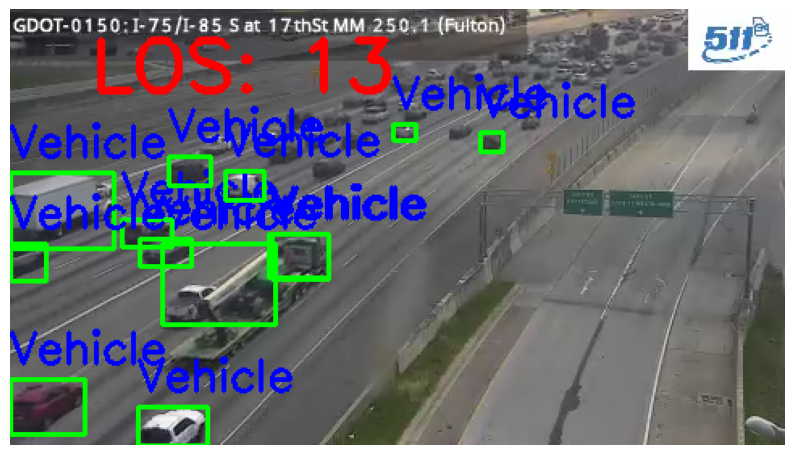

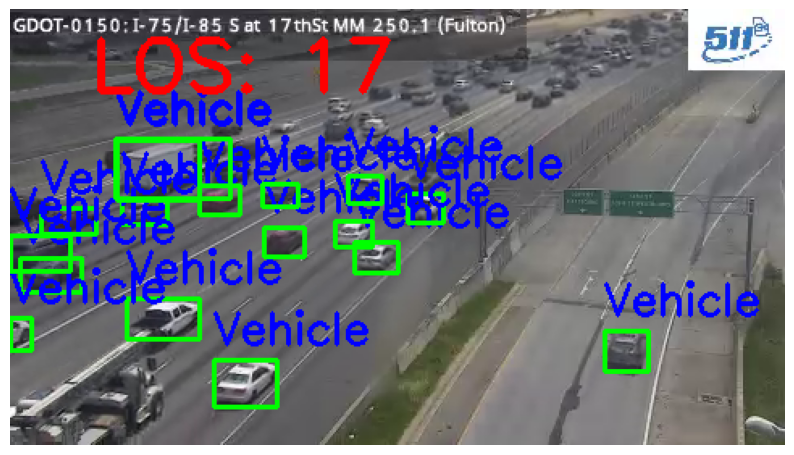

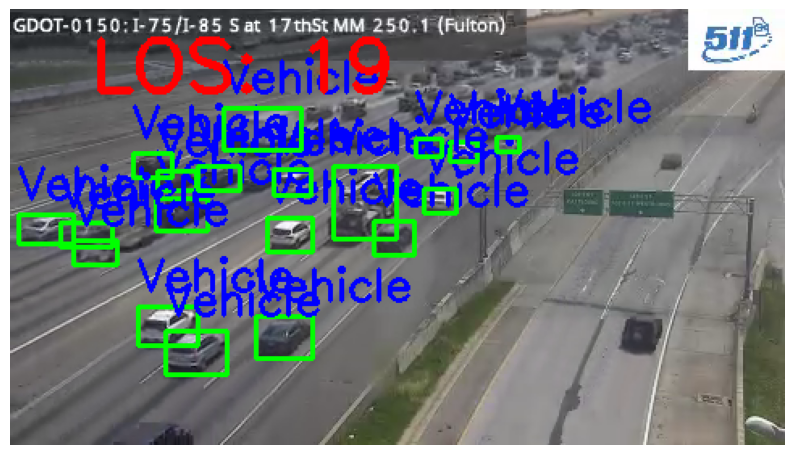

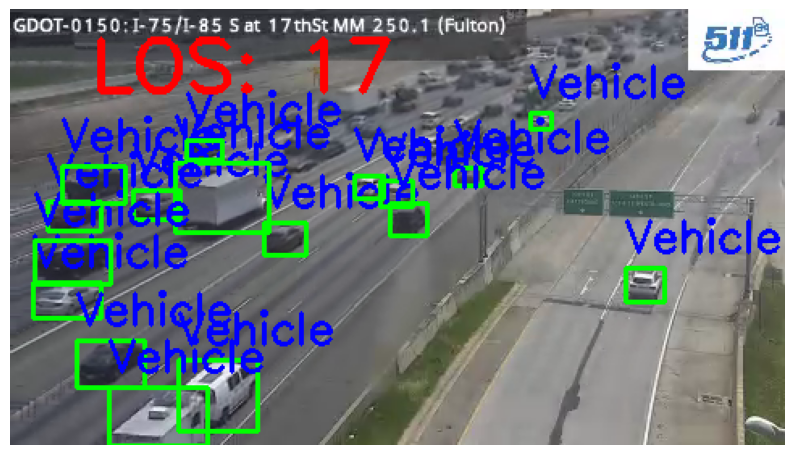

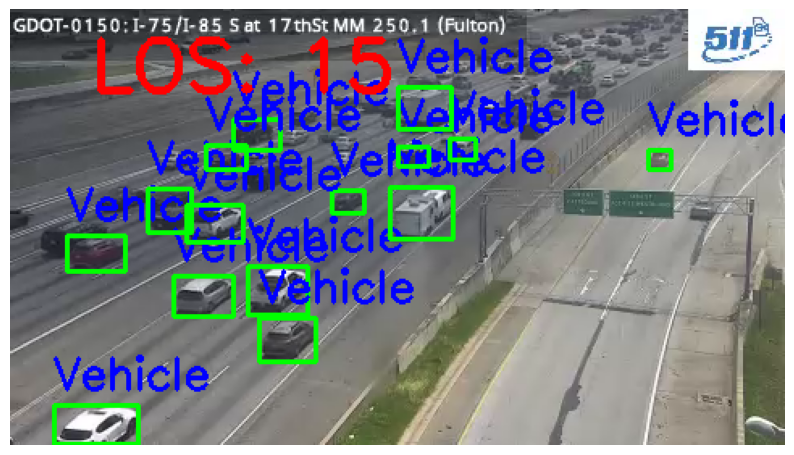

...

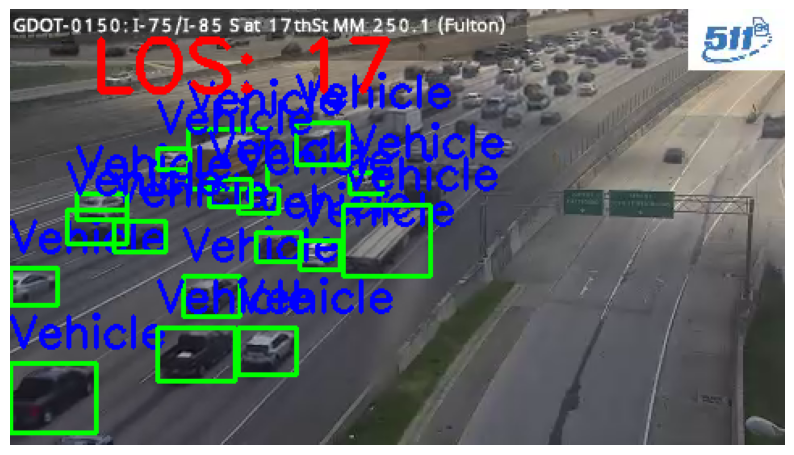

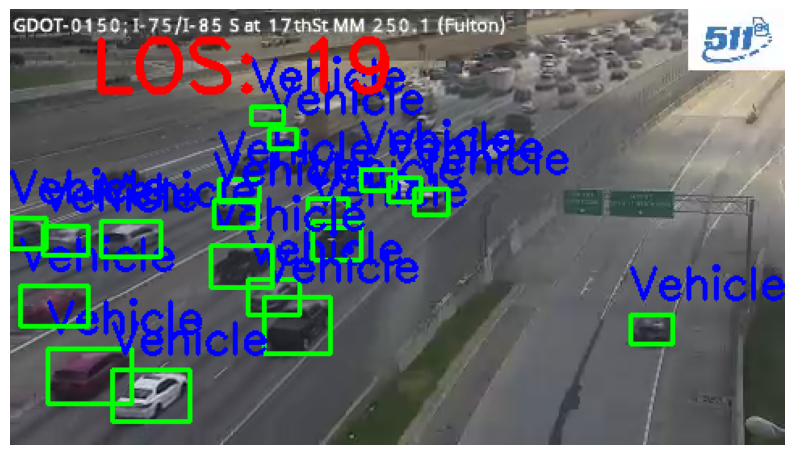

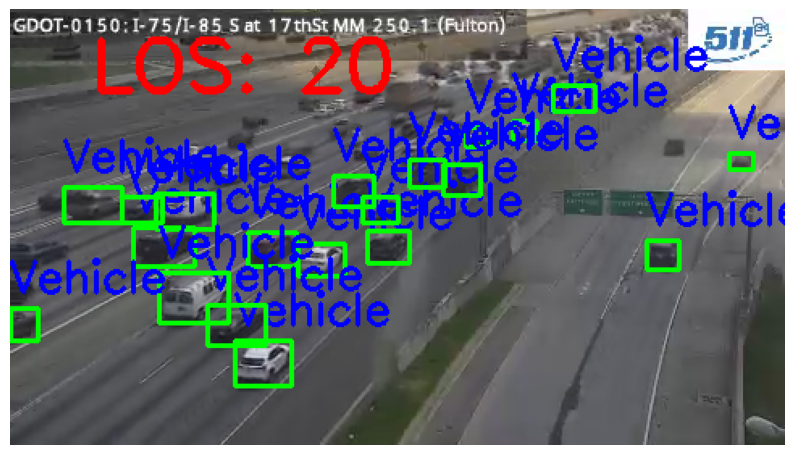

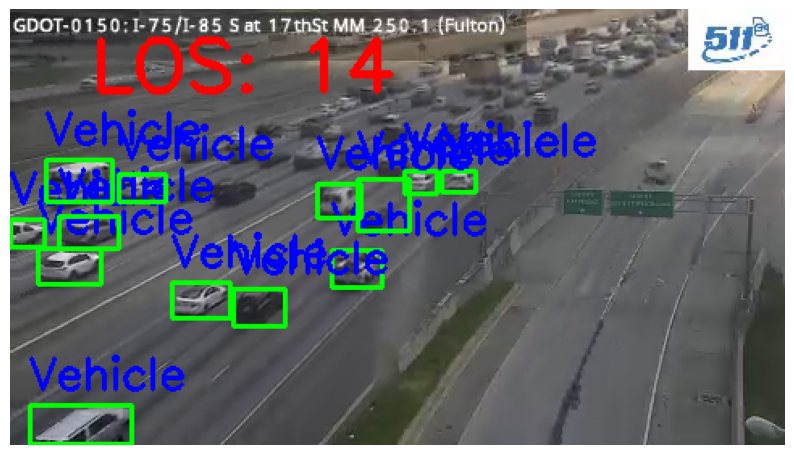

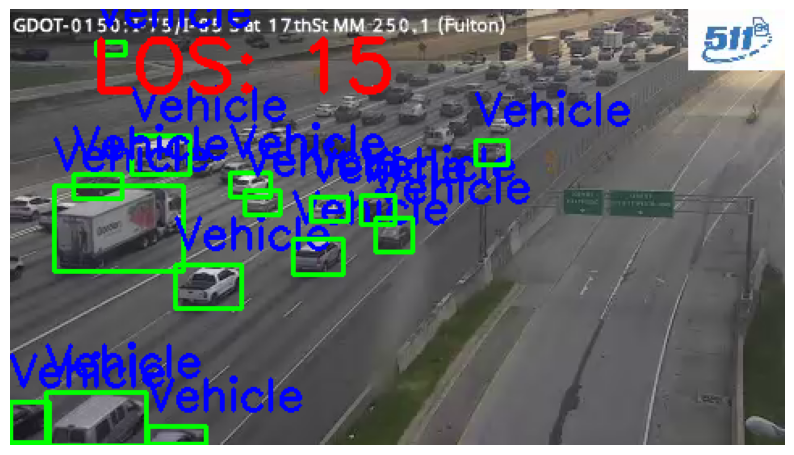

Time 0s: LOS F
Time 5s: LOS A
Time 10s: LOS A
Time 15s: LOS A
Time 20s: LOS A
Time 25s: LOS A
Time 30s: LOS A
Time 35s: LOS A
Time 40s: LOS A
Time 45s: LOS A
Time 50s: LOS A
Time 55s: LOS A
Time 60s: LOS A
Time 65s: LOS A
Time 70s: LOS A
Time 75s: LOS A
Time 80s: LOS A
Time 85s: LOS A
Time 90s: LOS A
Time 95s: LOS A
Time 100s: LOS A
Time 105s: LOS A
Time 110s: LOS A
Time 115s: LOS A


In [12]:
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
import time
import paho.mqtt.client as mqtt
import json

# Load YOLOv8 model
model = YOLO('yolov8s.pt')

# Initialize MQTT client
mqtt_client = mqtt.Client()
mqtt_client.connect(mqt_broker, 1883, 60)  # Use your service name and port

# Constants
FRAME_INTERVAL = 5  # seconds
VIDEO_FPS = 15  # Estimated FPS for the stream; adjust as necessary
FRAME_SKIP = FRAME_INTERVAL * VIDEO_FPS

# Initialize video capture
cap = cv2.VideoCapture(streaming_server)
frame_count = 0

def calculate_speed(centroid_prev, centroid_current, fps):
    distance = np.linalg.norm(np.array(centroid_current) - np.array(centroid_prev))
    speed = distance * fps  # Simplified speed calculation
    return speed

def calculate_LOS(vehicle_count, vehicle_speeds):
    avg_speed = np.mean(vehicle_speeds) if vehicle_speeds else 0
    density = vehicle_count / 100  # Simplified assumption of road length
    
    if density < 10 and avg_speed > 60:
        return 'A'
    elif density < 20 and avg_speed > 50:
        return 'B'
    elif density < 30 and avg_speed > 40:
        return 'C'
    elif density < 40 and avg_speed > 30:
        return 'D'
    elif density < 50 and avg_speed > 20:
        return 'E'
    else:
        return 'F'

# Tracking state
tracked_vehicles = {}
los_over_time = []

while cap.isOpened():
    ret, frame = cap.read()
    
    if not ret:
        break
    
    frame_count += 1
    if frame_count % FRAME_SKIP != 0:
        continue
    
    # Inference
    results = model(frame, verbose=False)
    
    vehicle_count = 0
    vehicle_speeds = []
    
    for result in results[0].boxes:
        x1, y1, x2, y2 = result.xyxy[0].cpu().numpy()  # Move tensor to CPU before converting to NumPy
        cls = int(result.cls[0].cpu().numpy())  # Move tensor to CPU before converting to NumPy
        
        if cls in [2, 3, 5, 7]:  # Consider only cars, buses, trucks
            vehicle_count += 1
            centroid = ((x1 + x2) / 2, (y1 + y2) / 2)
            
            # Speed calculation (Simplified)
            if vehicle_count in tracked_vehicles:
                speed = calculate_speed(tracked_vehicles[vehicle_count], centroid, VIDEO_FPS)
                vehicle_speeds.append(speed)
            
            tracked_vehicles[vehicle_count] = centroid
            
            # Draw bounding box and label
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            cv2.putText(frame, f'Vehicle', (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    
    los = calculate_LOS(vehicle_count, vehicle_speeds)
    los_over_time.append(los)
    
    # Add LOS label to the frame
    cv2.putText(frame, f'LOS: {los}', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 255), 3)
    
    # Convert BGR (OpenCV format) to RGB (Matplotlib format)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Encode the frame to JPEG
    _, buffer = cv2.imencode('.jpg', frame)
    jpg_as_text = buffer.tobytes().decode('latin1')  # Convert to string to send over MQTT

    # Prepare data to publish to MQTT
    data = {
        'frame': frame_count,
        'second': frame_count // VIDEO_FPS,
        'los': los,
        'image': jpg_as_text  # Include the image as a string
    }
    
    # Publish to MQTT topic
    mqtt_client.publish('traffic/los', json.dumps(data))
    
    # Display the frame (optional)
    plt.figure(figsize=(10, 6))
    plt.imshow(frame_rgb)
    plt.axis('off')
    plt.show()
    
    # Wait for the actual time interval (5 seconds)
    time.sleep(FRAME_INTERVAL)

cap.release()

# Output LOS over time
for time, los in enumerate(los_over_time):
    print(f"Time {time * FRAME_INTERVAL}s: LOS {los}")
